In [1]:
from pathlib import Path
from datetime import datetime
import pandas as pd
import great_expectations as ge

DATA_PATH = Path('../../../pet_project/tables')
DATA2_PATH = Path('../../../PTETA/PTETA/data/local/tables')


def get_tables(tabels_path: Path) -> list:
    result = [(datetime.strptime(p.name[9:-4], '%d_%b_%Y'), p)
              for p in tabels_path.iterdir()]

    return sorted(result, key=lambda x: x[0])

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [2]:
import json
import numpy as np
import matplotlib.pyplot as plt
from alibi_detect.cd import KSDrift

In [3]:
tables_path_list = get_tables(DATA_PATH) + get_tables(DATA2_PATH)
# tables_path_list

In [108]:
import folium
from folium import plugins
from folium.plugins import HeatMap

df = pd.read_csv(tables_path_list[1][1], encoding='utf-8' )
df.dropna(subset=['lat', 'lng'], inplace=True)

map_hooray = folium.Map(location=[48.28403268, 25.94117372],
                    zoom_start = 12) 


# Plot it on the map
HeatMap(
    df[["lat", "lng"]].values, 
    radius=5,
    blur=3).add_to(map_hooray)

# Display the map
map_hooray

In [106]:
folium.PolyLine?

Init signature: folium.PolyLine(locations, popup=None, tooltip=None, **kwargs)
Docstring:     
Draw polyline overlays on a map.

See :func:`folium.vector_layers.path_options` for the `Path` options.

Parameters
----------
locations: list of points (latitude, longitude)
    Latitude and Longitude of line (Northing, Easting)
popup: str or folium.Popup, default None
    Input text or visualization for object displayed when clicking.
tooltip: str or folium.Tooltip, default None
    Display a text when hovering over the object.
smooth_factor: float, default 1.0
    How much to simplify the polyline on each zoom level.
    More means better performance and smoother look,
    and less means more accurate representation.
no_clip: Bool, default False
    Disable polyline clipping.
**kwargs
    Other valid (possibly inherited) options. See:
    https://leafletjs.com/reference-1.6.0.html#polyline
File:           c:\users\вадим\appdata\roaming\python\python38\site-packages\folium\vector_layers.py


In [109]:
df = pd.read_csv(tables_path_list[1][1], encoding='utf-8' )
df.dropna(subset=['lat', 'lng'], inplace=True)
mask = (48.0 < df["lat"] ) & (df["lat"] < 48.5)
mask &= (25.8 < df["lng"] ) & (df["lng"] < 26.1)
# df[(48.0 < df["lat"] ) & (df["lat"] < 48.5)]
df[mask].shape, df.shape 
df = df[mask]

In [110]:
# df.info()

In [83]:
df["lat"].values.min()

48.21982833333333

In [ ]:
# 48.0 < 48.5
# 25.8 < 26.1

In [102]:
res = np.histogram2d(df["lat"].values, df["lng"].values, 
                     bins=(100, 100))

In [103]:
res[1]

array([48.21982833, 48.22133832, 48.2228483 , 48.22435828, 48.22586827,
       48.22737825, 48.22888823, 48.23039822, 48.2319082 , 48.23341818,
       48.23492817, 48.23643815, 48.23794813, 48.23945812, 48.2409681 ,
       48.24247808, 48.24398807, 48.24549805, 48.24700803, 48.24851802,
       48.250028  , 48.25153798, 48.25304797, 48.25455795, 48.25606793,
       48.25757792, 48.2590879 , 48.26059788, 48.26210787, 48.26361785,
       48.26512783, 48.26663782, 48.2681478 , 48.26965778, 48.27116777,
       48.27267775, 48.27418773, 48.27569772, 48.2772077 , 48.27871768,
       48.28022767, 48.28173765, 48.28324763, 48.28475762, 48.2862676 ,
       48.28777758, 48.28928757, 48.29079755, 48.29230753, 48.29381752,
       48.2953275 , 48.29683748, 48.29834747, 48.29985745, 48.30136743,
       48.30287742, 48.3043874 , 48.30589738, 48.30740737, 48.30891735,
       48.31042733, 48.31193732, 48.3134473 , 48.31495728, 48.31646727,
       48.31797725, 48.31948723, 48.32099722, 48.3225072 , 48.32

In [88]:
import pymap3d

In [90]:
df[["lat", "lng"]].values.mean(axis=0)

array([48.28403268, 25.94117372])

In [101]:
lat0, lon0 = df[["lat", "lng"]].values.mean(axis=0)
lat1, lon1, _ = pymap3d.enu2geodetic(e=100, n=100, u=0, lat0=lat0, lon0=lon0, h0=0, ell=None, deg=True)
lat1 - lat0, lon1 - lon0

(0.0008993062146629427, 0.001347463675347882)

In [105]:
tp = df[["lat", "lng"]].values.min(axis=0)
btm = df[["lat", "lng"]].values.max(axis=0)

array([48.37082667, 26.0356    ])

In [6]:
import seaborn as sns

In [26]:
df[df["lat"] > 48.5]

,id,imei,name,stateCode,stateName,lat,lng,speed,orientation,gpstime,routeId,routeName,routeColour,inDepo,busNumber,perevId,perevName,remark,online,idBusTypes
56311,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:24:53,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
56585,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:27:25,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
56901,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:30:45,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
57676,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:40:39,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
57993,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:46:08,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
58434,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:55:55,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
58594,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 09:59:53,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
58841,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 10:05:37,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
59104,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 10:11:19,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1
59280,387,355227046451670,H69,used,used,50.250577,37.523327,0.0,30.85,2022-10-10 10:15:04,16,2,green,False,0856,13,Олег Валентинович 39 марш,0856 DNSNTNK,True,1


In [22]:
df.shape, df.dropna(subset=['lat', 'lng']).shape

((188630, 20), (188628, 20))

In [29]:
np.arange(0.98, 1.00, 1e-3)

array([0.98 , 0.981, 0.982, 0.983, 0.984, 0.985, 0.986, 0.987, 0.988,
       0.989, 0.99 , 0.991, 0.992, 0.993, 0.994, 0.995, 0.996, 0.997,
       0.998, 0.999, 1.   ])

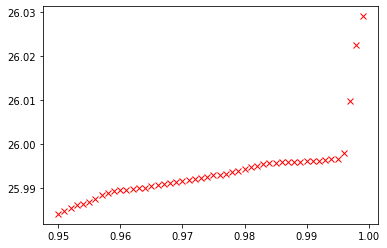

In [47]:
l_space = np.arange(0.95, 0.9999, 1e-3)

plt.plot(l_space, [np.quantile(df["lng"].values, q) for q in l_space], 'rx')

In [52]:
# df[(26.02 < df["lng"] ) & (df["lng"] < 27)]

In [64]:
df[["lat", "lng"]].values.mean(axis=0)

array([48.28403268, 25.94117372])

In [71]:
# HeatMap?

In [113]:
import folium
from folium import plugins
from folium.plugins import HeatMap


map_hooray = folium.Map(location=[48.28403268, 25.94117372],
                    zoom_start = 12) 


# Plot it on the map
HeatMap(
    df[["lat", "lng"]].values, 
    radius=5,
    blur=3).add_to(map_hooray)

tp = df[["lat", "lng"]].values.min(axis=0)
bm = df[["lat", "lng"]].values.max(axis=0)
dt = bm - tp

folium.PolyLine([[tp[0], tp[1]],
                 [bm[0], tp[1]],
                 [bm[0], bm[1]],
                 [tp[0], bm[1]],
                 [tp[0], tp[1]]
                ] ).add_to(map_hooray)


tp -= dt*0.05
bm += dt*0.05

folium.PolyLine([[tp[0], tp[1]],
                 [bm[0], tp[1]],
                 [bm[0], bm[1]],
                 [tp[0], bm[1]],
                 [tp[0], tp[1]]
                ] ).add_to(map_hooray)

# Display the map
map_hooray

In [74]:
df[["lat", "lng"]].values.min(axis=0), df[["lat", "lng"]].values.max(axis=0)

(array([48.21982833, 25.85978667]), array([48.37082667, 26.0356    ]))

In [114]:
tp , bm

(array([48.21227842, 25.850996  ]), array([48.37837658, 26.04439067]))

In [ ]:
# 48.2198 -> 48.3708 # 48.2122 -> 48.3783
# 25.8598 -> 26.0356 # 25.8509 -> 26.0444

In [120]:
lat0, lon0 = df[["lat", "lng"]].values.mean(axis=0)
lat1, lon1, _ = pymap3d.enu2geodetic(e=100, n=100, u=0, lat0=lat0, lon0=lon0, h0=0, ell=None, deg=True)
lat1 - lat0, lon1 - lon0

(0.0008993062146629427, 0.001347463675347882)

In [123]:
(48.3783 - 48.2122)//(lat1 - lat0), (26.0444 - 25.8509)//(lon1 - lon0)

(184.0, 143.0)

In [125]:
dist, _, _ = np.histogram2d(df["lat"].values, df["lng"].values, 
              range=[[48.2122, 48.3783], [25.8509, 26.0444]], 
              bins=(200, 200) )

In [132]:
ds = np.dstack([dist]*5)
ds.shape, np.median(ds, axis=-1).shape

((200, 200, 5), (200, 200))

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


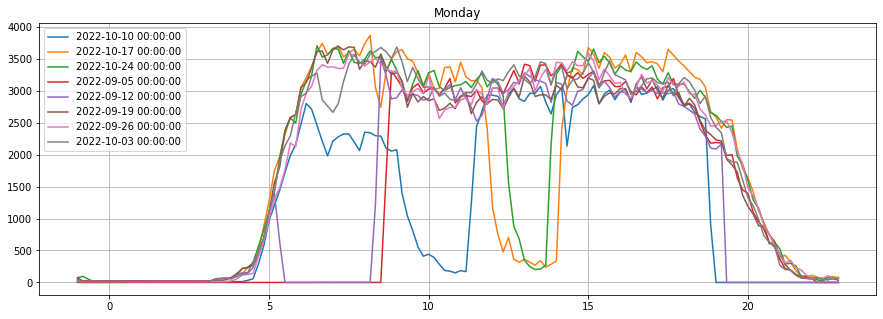

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


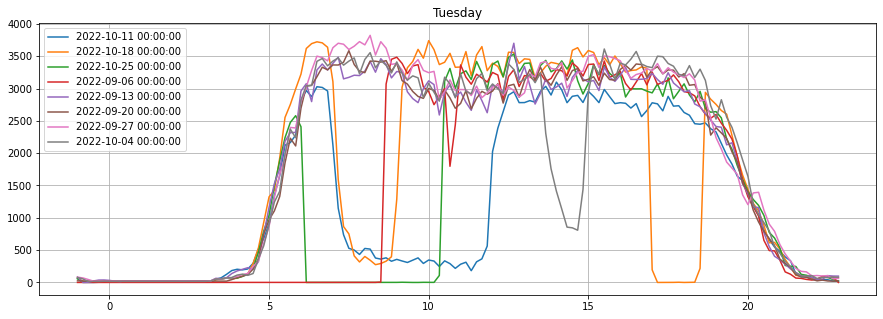

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (13,18,22,23,24,29,31,32,33,36,37,38) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program file

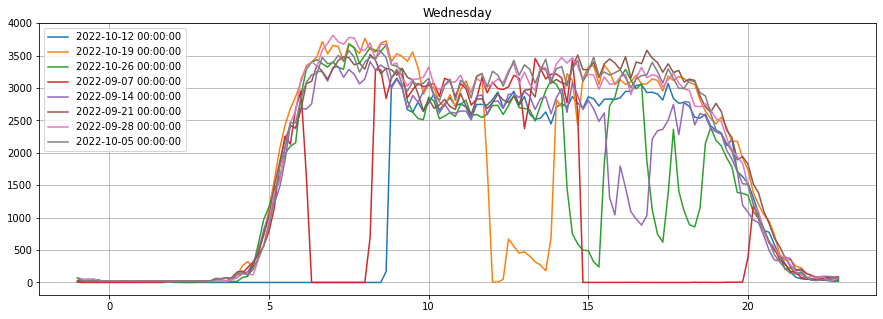

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


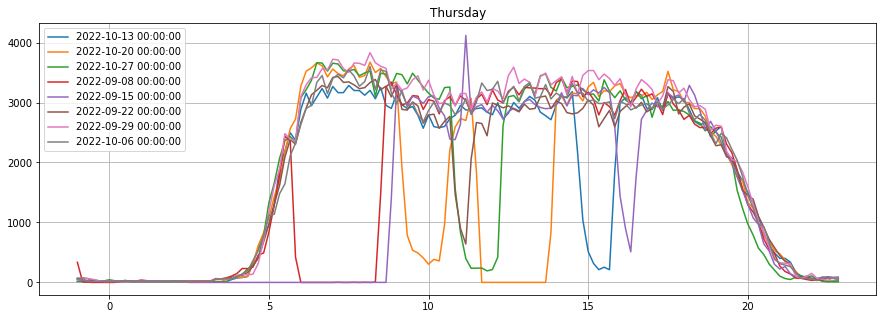

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


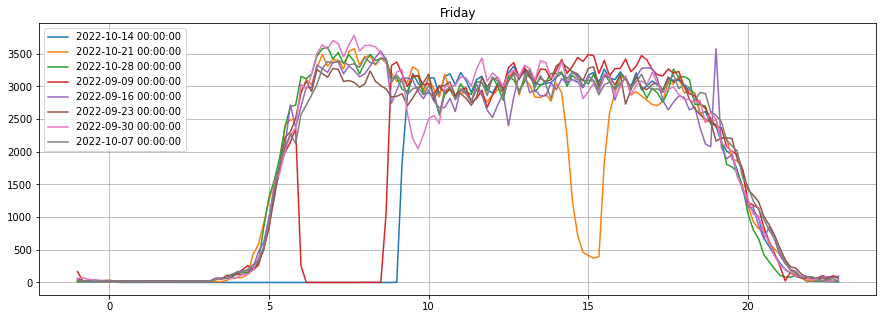

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


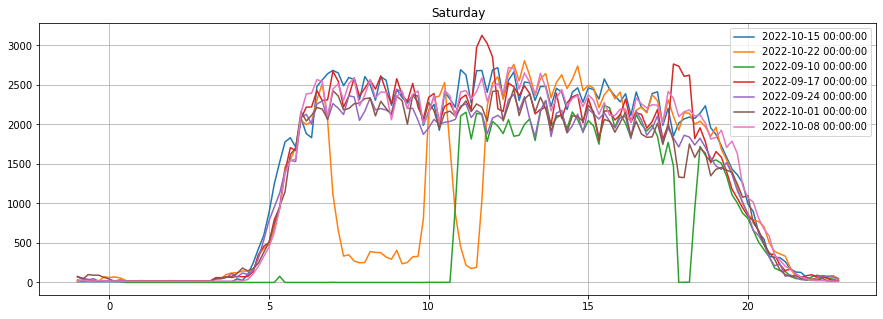

c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):
c:\program files\python38\lib\site-packages\IPython\core\interactiveshell.py:3361: DtypeWarning: Columns (14) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


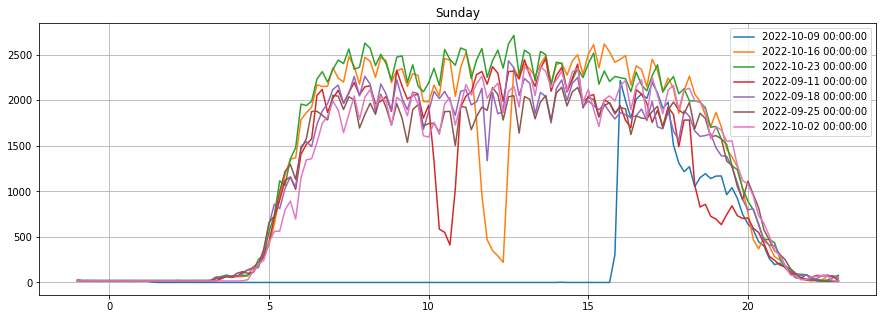

In [21]:
dists = dict()

for weekday_num in range(7): 
    plt.figure(figsize=(15, 5))
    loc_table_info = [table_info for table_info in tables_path_list 
           if table_info[0].weekday() == weekday_num]
    
    
    for i, table_info in enumerate(loc_table_info):
        weekday_word = table_info[0].strftime("%A")
        dist_hist = get_time_dist(table_info)
        plt.plot(dist_hist[1][:-1], dist_hist[0], label=table_info[0]) 
        if dists.get(weekday_word) is None: 
            dists[weekday_word] = dist_hist[0]
        else: 
            dists[weekday_word] = np.dstack([dists[weekday_word], dist_hist[0]])
    
    plt.title(weekday_word)
    plt.legend()
    plt.grid()
    plt.show()

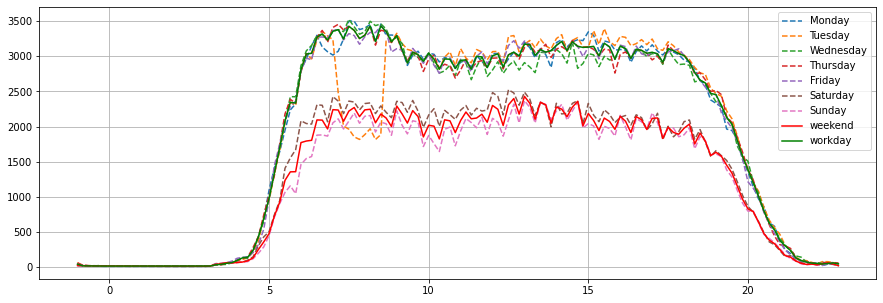

In [23]:
plt.figure(figsize=(15, 5))

for weekday_name in dists: 
    
    plt.plot(dist_hist[1][:-1], 
             np.median(dists[weekday_name], axis=2)[0], 
             label=weekday_name, linestyle='--') 
        
weekend = [np.median(dists[wd_name], axis=2)[0]
           for wd_name in dists if wd_name in ['Sunday', 'Saturday'] ]
weekend = np.median(np.dstack(weekend), axis=2)[0] 
plt.plot(dist_hist[1][:-1], weekend, 'r', label='weekend') 

workday = [np.median(dists[wd_name], axis=2)[0]
           for wd_name in dists if not(wd_name in ['Sunday', 'Saturday']) ]

workday = np.median(np.dstack(workday), axis=2)[0] 
plt.plot(dist_hist[1][:-1], workday, 'g', label='workday') 

        
plt.legend()
plt.grid()
plt.show()

In [65]:
dist_hist[1][:-1]
# workday.shape

array([-1.        , -0.83333333, -0.66666667, -0.5       , -0.33333333,
       -0.16666667,  0.        ,  0.16666667,  0.33333333,  0.5       ,
        0.66666667,  0.83333333,  1.        ,  1.16666667,  1.33333333,
        1.5       ,  1.66666667,  1.83333333,  2.        ,  2.16666667,
        2.33333333,  2.5       ,  2.66666667,  2.83333333,  3.        ,
        3.16666667,  3.33333333,  3.5       ,  3.66666667,  3.83333333,
        4.        ,  4.16666667,  4.33333333,  4.5       ,  4.66666667,
        4.83333333,  5.        ,  5.16666667,  5.33333333,  5.5       ,
        5.66666667,  5.83333333,  6.        ,  6.16666667,  6.33333333,
        6.5       ,  6.66666667,  6.83333333,  7.        ,  7.16666667,
        7.33333333,  7.5       ,  7.66666667,  7.83333333,  8.        ,
        8.16666667,  8.33333333,  8.5       ,  8.66666667,  8.83333333,
        9.        ,  9.16666667,  9.33333333,  9.5       ,  9.66666667,
        9.83333333, 10.        , 10.16666667, 10.33333333, 10.5 

In [67]:
gps_data_update_frequency = dict({
    "workday": [dist_hist[1][:-1].tolist(), workday.tolist()], 
    "weekend": [dist_hist[1][:-1].tolist(), weekend.tolist()]
})
# gps_data_update_frequency

with open('../data/gps_data_update_frequency.json', 'w', encoding='utf-8') as f:
    json.dump(gps_data_update_frequency, f, ensure_ascii=False)

In [133]:
with open('../data/coordinate_distribution2d.json', 'r', encoding='utf-8') as f:
    ref_data = json.load(f)

In [139]:
ref_data['coordinate_distribution2d'].keys()

dict_keys(['distribution_x_space', 'distribution_y_space', 'distribution_pdf'])

In [157]:
# lspace[d_hist==0]
# d_hist==0
np.array(lspace)[d_hist==0]
# np.diff(np.array(lspace)[d_hist==0])
d = 26.03635294 - 25.85807529
25.85807529 - d*.1, 26.03635294 + d*.1

(25.840247525, 26.054180705)

In [158]:
# lspace = ref_data['coordinate_distribution2d']['distribution_y_space']
# d_hist = np.sum(ref_data['coordinate_distribution2d']['distribution_pdf'], axis=0)

# plt.plot(lspace,
#     d_hist + 1, 
#     'rx'
# )
# plt.yscale('log')

In [32]:
gps_data_update_frequency.keys()

dict_keys(['workday', 'weekend'])

In [62]:
len(gps_data_update_frequency['workday'])

144

In [33]:
# Initialize drift detector
drift_detector = KSDrift(workday, p_val=0.01)

In [40]:
skd = drift_detector.predict(dists['Monday'][0][:, 0], return_p_val=True, return_distance=True)['data']
f"is_drift: {skd['is_drift']}, 'distance': {skd['distance'][0]}, 'p_val': {skd['p_val'][0]:.4f}"

{'is_drift': 1,
 'distance': array([0.38194445], dtype=float32),
 'p_val': array([5.9103306e-10], dtype=float32),
 'threshold': 0.01}

In [69]:
skd

{'is_drift': 0,
 'distance': array([0.1388889], dtype=float32),
 'p_val': array([0.11291078], dtype=float32),
 'threshold': 0.05}

In [18]:
24*6

144

In [59]:
table_info + ('s',)

(datetime.datetime(2022, 10, 2, 0, 0),
 WindowsPath('../../../PTETA/PTETA/data/local/tables/data_for_02_OCT_2022.csv'),
 's')

In [68]:
drift_detector.predict?

Signature:
drift_detector.predict(
    x: Union[numpy.ndarray, list],
    drift_type: str = 'batch',
    return_p_val: bool = True,
    return_distance: bool = True,
) -> Dict[Dict[str, str], Dict[str, Union[numpy.ndarray, int, float]]]
Docstring:
Predict whether a batch of data has drifted from the reference data.

Parameters
----------
x
    Batch of instances.
drift_type
    Predict drift at the 'feature' or 'batch' level. For 'batch', the test statistics for
    each feature are aggregated using the Bonferroni or False Discovery Rate correction (if n_features>1).
return_p_val
    Whether to return feature level p-values.
return_distance
    Whether to return the test statistic between the features of the new batch and reference data.

Returns
-------
Dictionary containing 'meta' and 'data' dictionaries.
'meta' has the model's metadata.
'data' contains the drift prediction and optionally the feature level p-values,
 threshold after multivariate correction if needed and test statisti

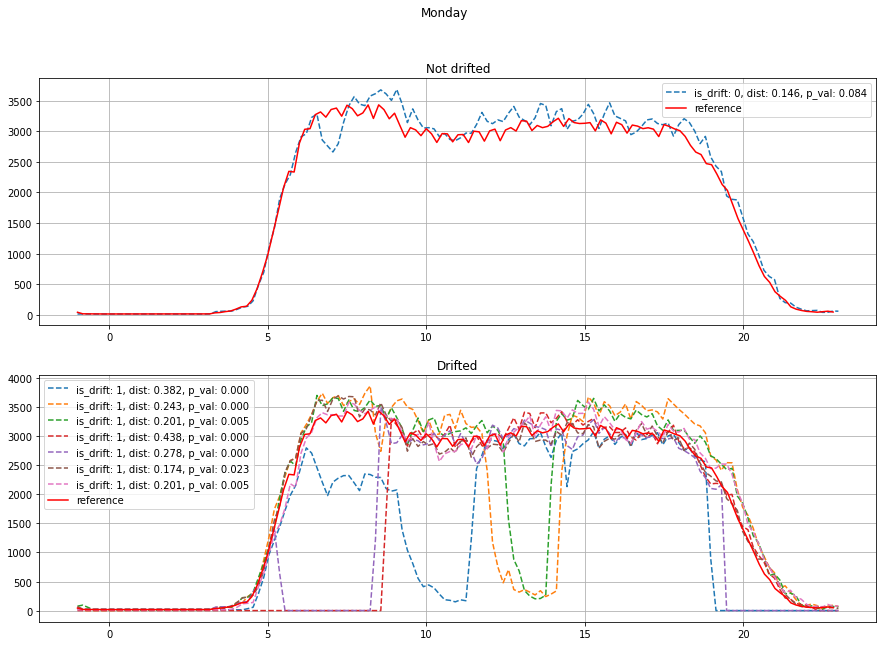

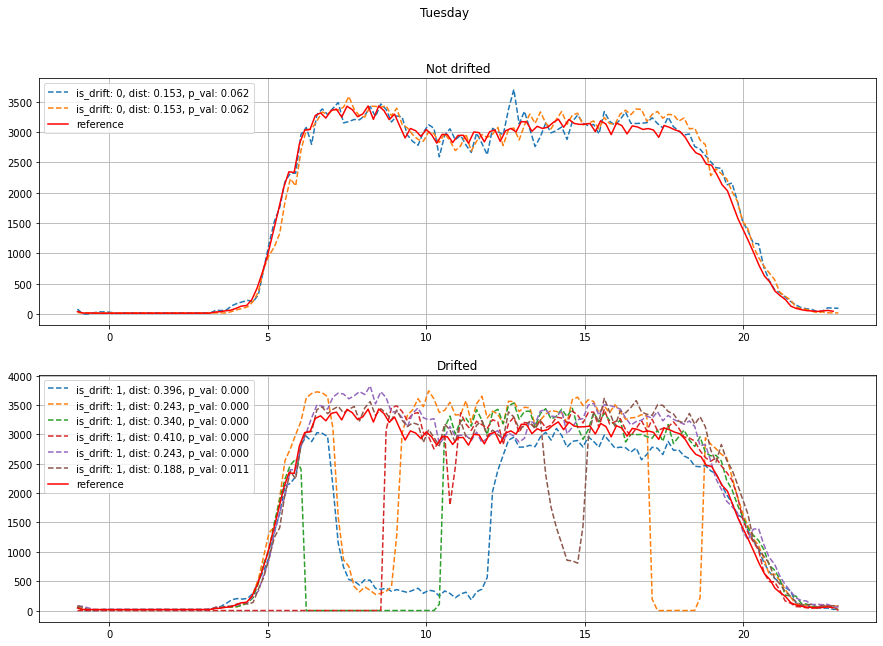

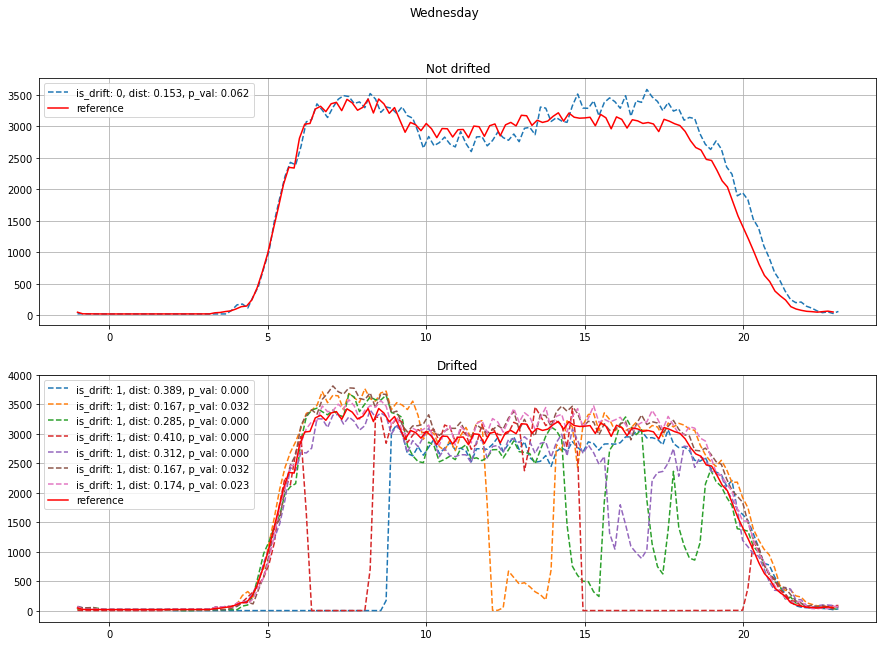

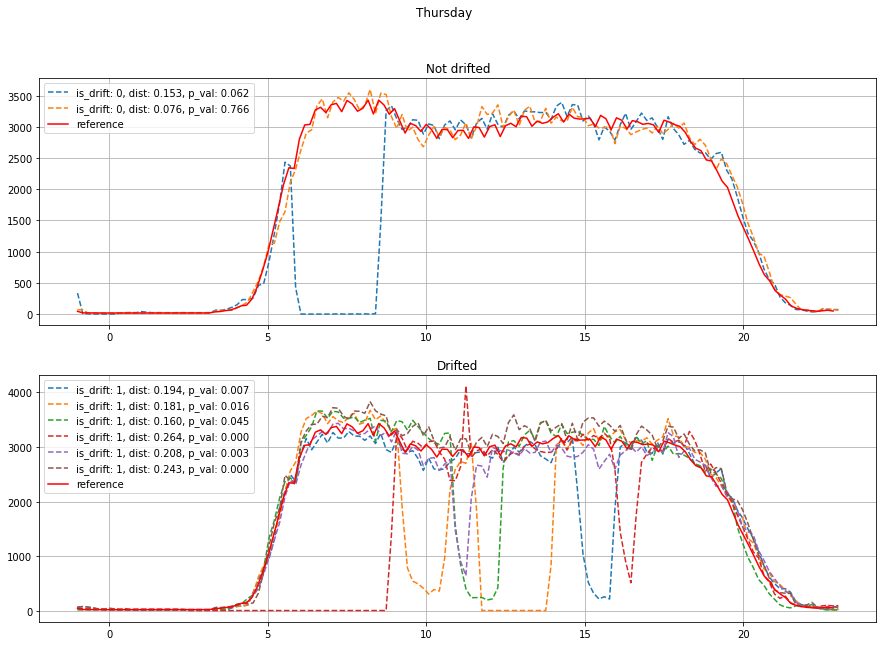

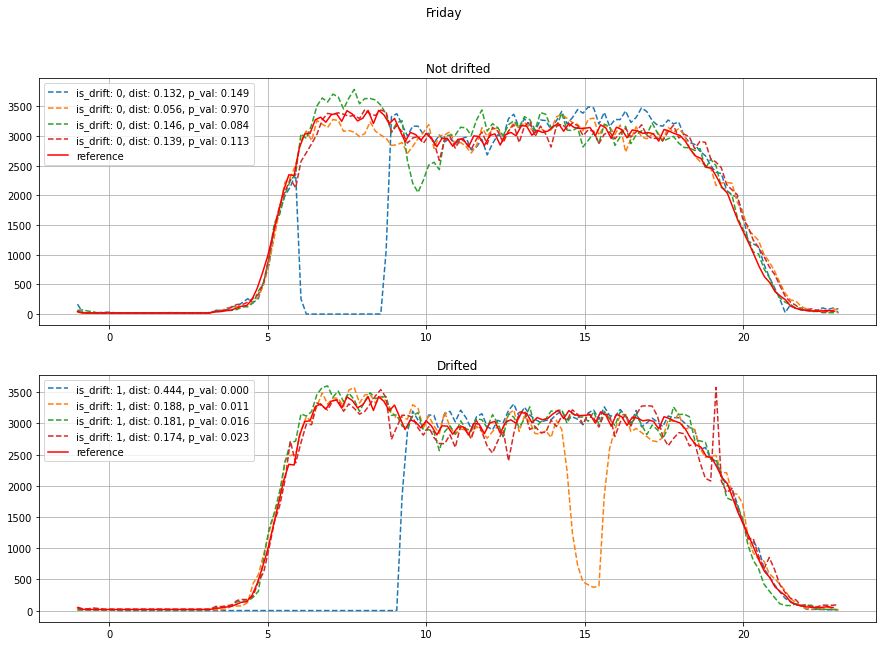

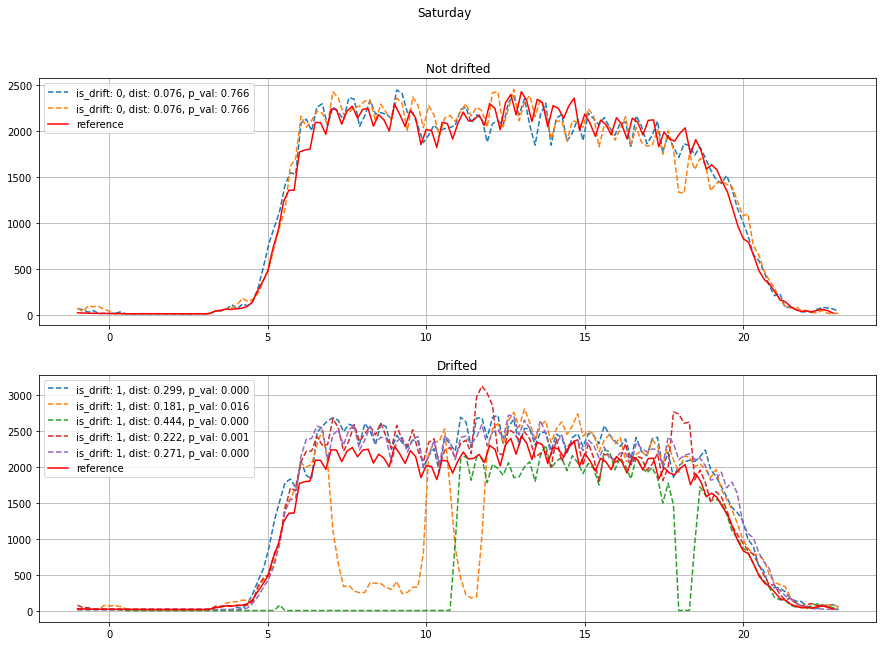

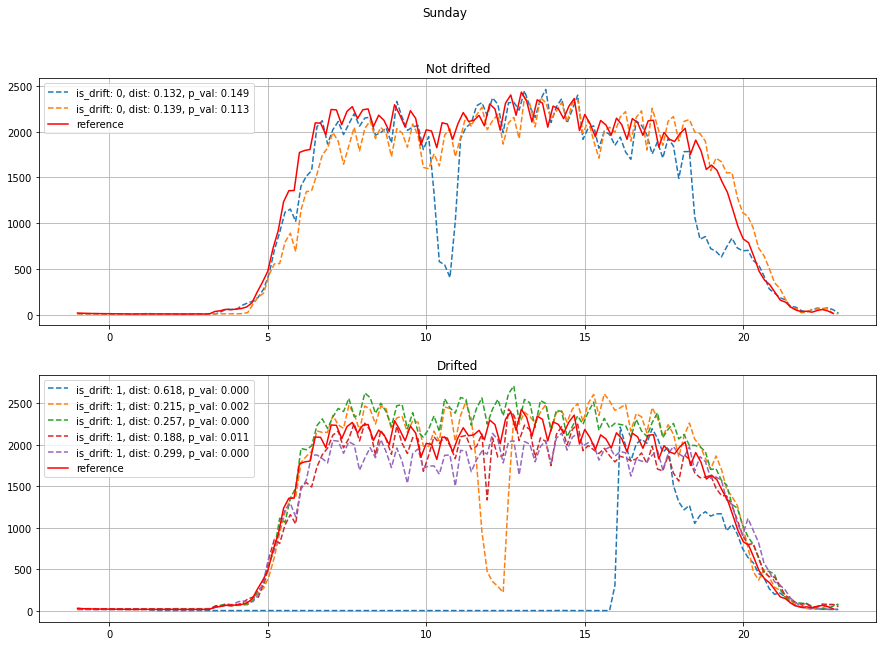

In [56]:
timespace = np.linspace(-1, 23, num=24*6)

for wd_num, wd_name in enumerate(dists): 
#     plt.figure(figsize=(15, 5))
    

    ref_dist = None
    if wd_num < 5:
        ref_dist = gps_data_update_frequency['workday']
    else: 
        ref_dist = gps_data_update_frequency['weekend']
    ref_dist = np.array(ref_dist)
        
    # Initialize drift detector
    drift_detector = KSDrift(ref_dist, p_val=0.05)
    
    f, ax = plt.subplots(2, 1, figsize=(15, 10))
 
    wd_dists = dists[wd_name][0]
    for i in range(wd_dists.shape[-1]):
        skd = drift_detector.predict(wd_dists[:, i], return_p_val=True, return_distance=True)['data']
        
        ax[skd['is_drift']].plot(timespace, 
                 wd_dists[:, i], 
                 label=f"is_drift: {skd['is_drift']}, dist: {skd['distance'][0]:.3f}, p_val: {skd['p_val'][0]:.3f}", 
                 linestyle='--') 

        
    for i in range(2):
        ax[i].plot(dist_hist[1][:-1], ref_dist, 'r', label='reference') 
        ax[i].set_title(f"{'Drifted' if i else 'Not drifted'}")
        ax[i].legend()
        ax[i].grid()
    f.suptitle(wd_name)
    plt.show()